# TP01 Image processing - Final project on nevus detection

## Tasks 
- Remove hair from nevus images
- Segment nevus cells
- Calculate similarity to ground truth mask of nevus cells


## Import modules and load data 

In [ ]:
import glob
import skimage
import numpy as np
import matplotlib.pyplot as plt
import skimage.io as skio
from sklearn.cluster import KMeans
from skimage.color import rgb2gray
import random
import skimage.morphology as morpho
from skimage import filters
import cv2
from skimage.filters import threshold_otsu
from skimage.segmentation import active_contour
import pandas as pd

In [ ]:
def data_loader(img_folder, mask_folder):

  imgs = []
  masks = []
  img_names = []
  mask_names = []

  for img_file in sorted(glob.glob(img_folder + "/*.jpg")):
    img = skio.imread(img_file,plugin='matplotlib')
    img_name = img_file.split(".")[0]
    imgs.append(img)
    img_names.append(img_name)

  for mask_file in sorted(glob.glob(mask_folder + "/*.png")):
    mask = skio.imread(mask_file,plugin='matplotlib')
    mask_name = mask_file.split(".")[0]
    masks.append(mask)
    mask_names.append(mask_name)

  return imgs, masks, img_names, mask_names  

In [ ]:
imgs, masks, img_names, mask_names = data_loader("/content/imgs", "/content/masks")

## Visualize nevus imgs

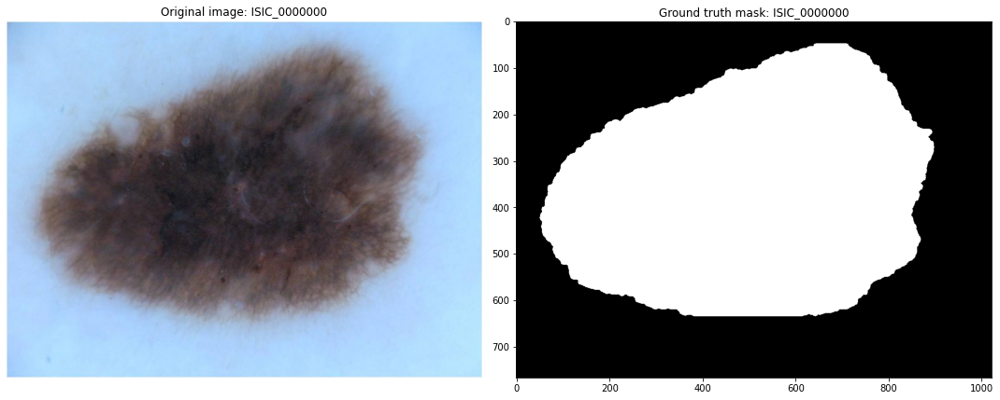

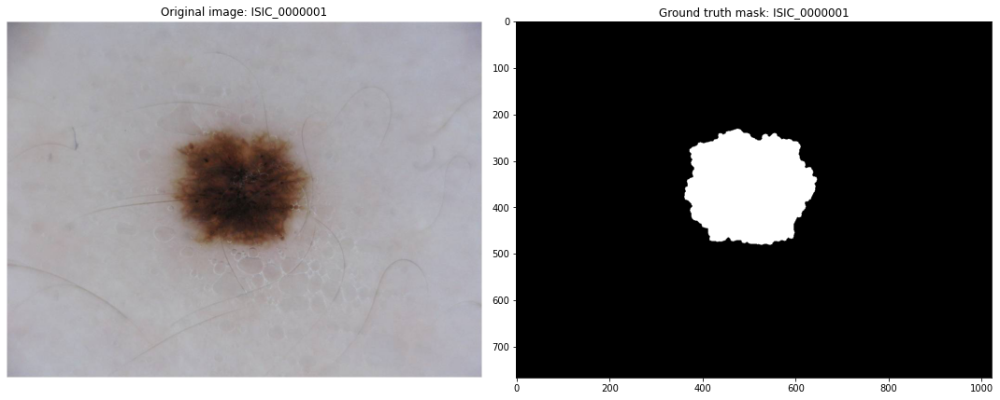

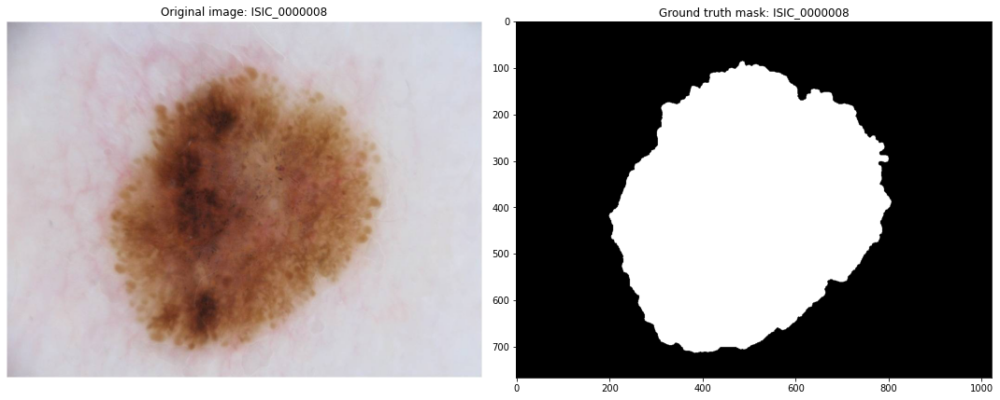

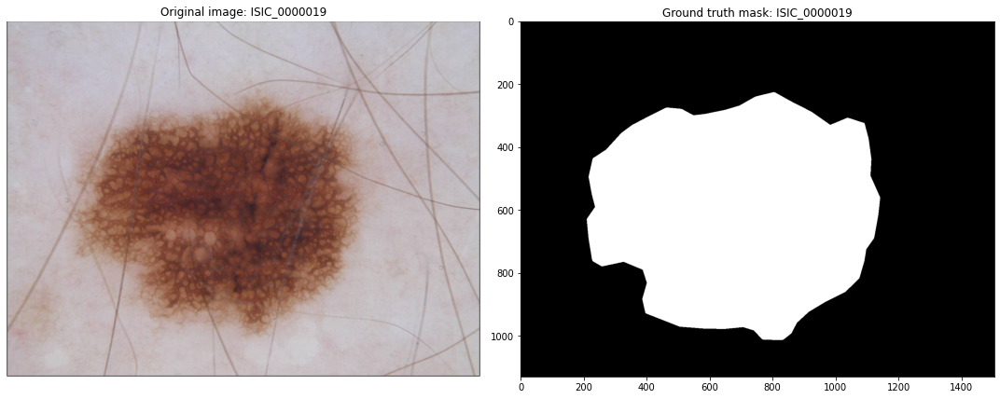

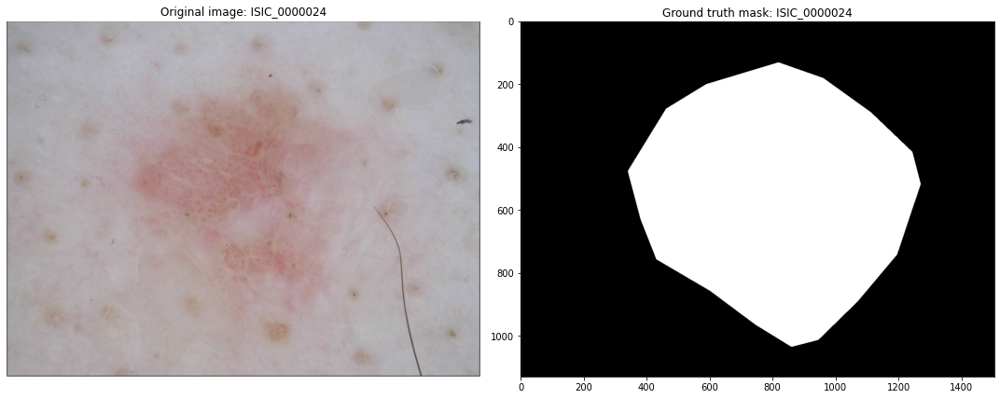

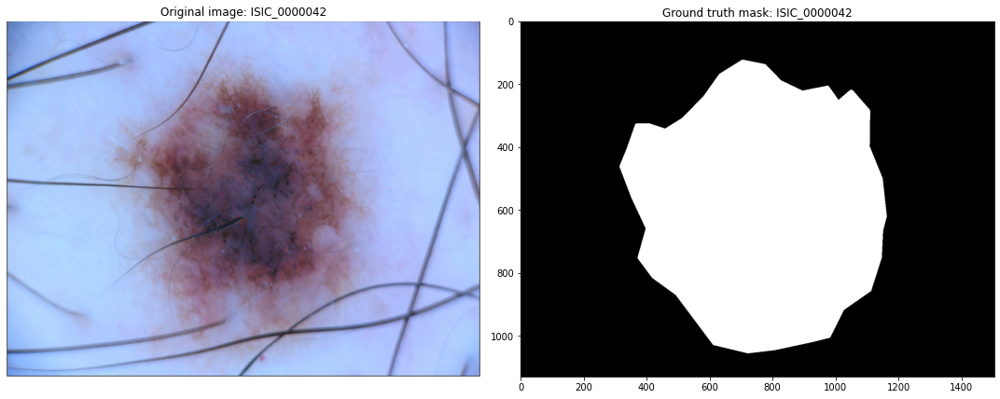

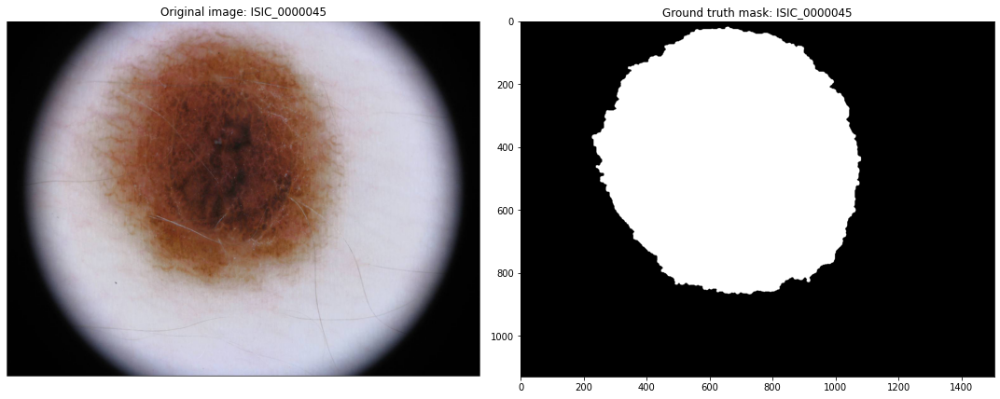

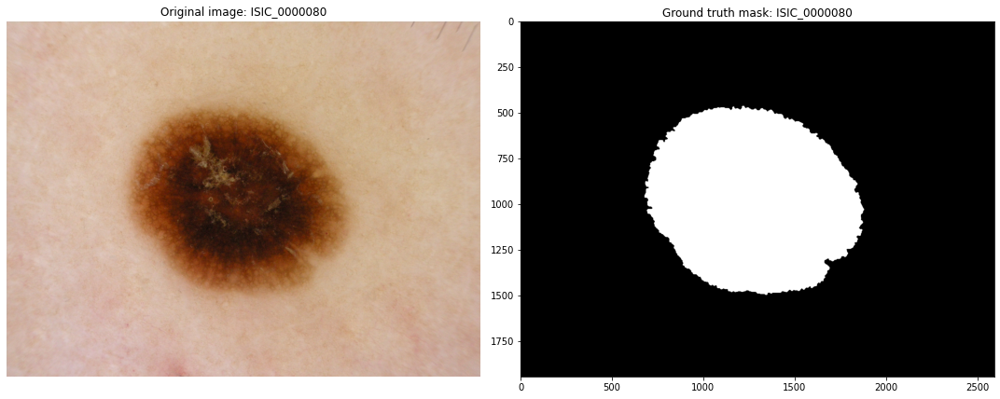

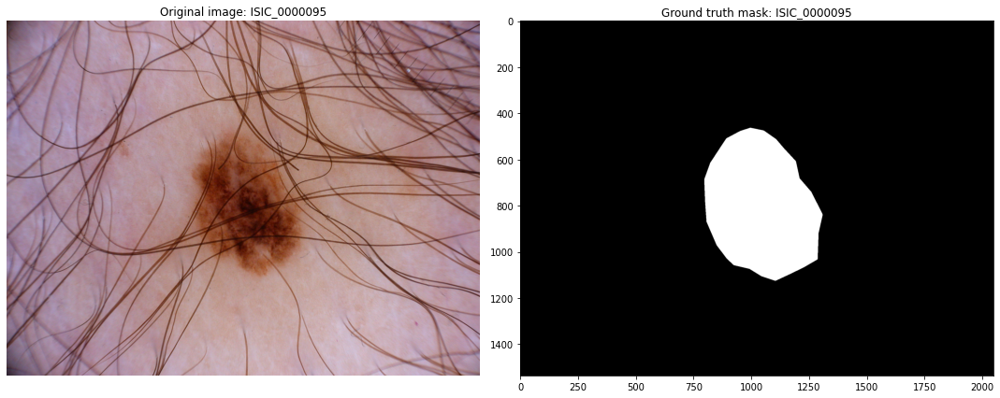

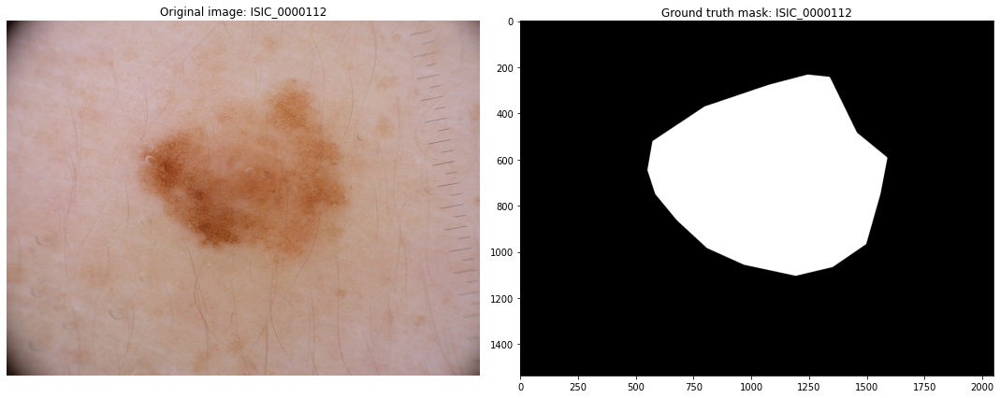

In [ ]:

for i, img in enumerate(imgs):
  fig, ax = plt.subplots(1,2, figsize = (15,15))
  ax[0].set_title('Original image: ' + str(img_names[i].split("/")[3]))
  ax[0].axis('off')
  ax[0].imshow(img)

  ax[1].set_title('Ground truth mask: ' + str(img_names[i].split("/")[3]))
  ax[1].imshow(masks[i], cmap="gray")
  
  plt.tight_layout()
  plt.show()

# Hair removal
This part implements the hair removal functionality.  It is based on morphological operations on the original, non-processed img. 
- First, an erosion and dilation are applied. 
- Then, the difference between the dilated and errored img is calculated to get the hair cell locations, encoded as morphological gradients. The result is then binarized to a mask highlighting the hair cells. 
- The hair mask is later used for a multiplication with the nevus mask.
- After the multiplication, binary closing with bigger sized disk is applied. It fixes some of the artifacts (black holes inside the mask) caused by binarization of hair mask.

## Example of the hair removal pipeline

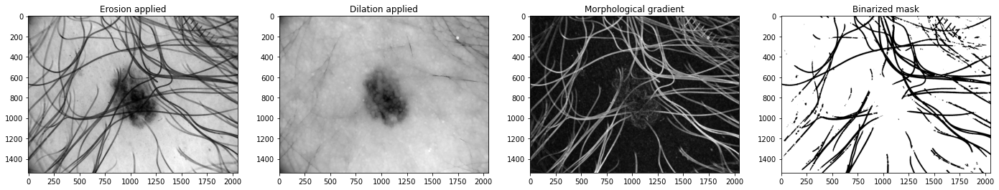

In [ ]:
example = imgs[8]
grayscale = cv2.cvtColor(example, cv2.COLOR_RGB2GRAY)
strell = morpho.disk(5)
er = morpho.erosion(grayscale,strell)
strell2 = morpho.disk(10)
di = morpho.dilation(grayscale,strell2)
hair = di - er
hair_mask = (hair > 70).astype(float)
negativ = np.ones(hair_mask.shape) - hair_mask
mask_hair = negativ
plt.figure(figsize = (24,24))
plt.subplot(441).set_title("Erosion applied")
plt.imshow(er, cmap = "gray")

plt.subplot(442).set_title("Dilation applied")
plt.imshow(di, cmap = "gray")

plt.subplot(443).set_title("Morphological gradient")
plt.imshow(hair, cmap = "gray")

plt.subplot(444).set_title("Binarized mask")
plt.imshow(mask_hair, cmap = "gray")
plt.show()

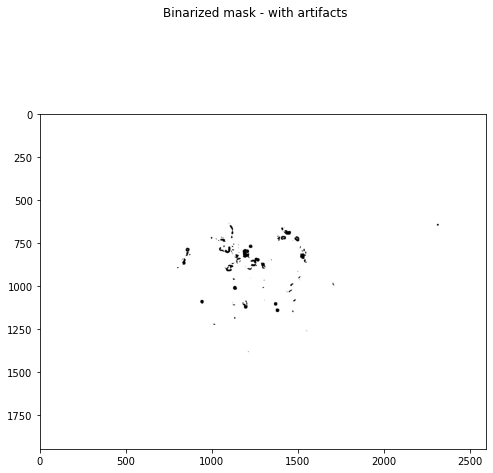

In [ ]:
example = imgs[7]
grayscale = cv2.cvtColor(example, cv2.COLOR_RGB2GRAY)
strell = morpho.disk(5)
er = morpho.erosion(grayscale,strell)
strell2 = morpho.disk(10)
di = morpho.dilation(grayscale,strell2)
hair = di - er
hair_mask = (hair > 70).astype(float)
negativ = np.ones(hair_mask.shape) - hair_mask
mask_hair = negativ
plt.figure(figsize = (8,8)).suptitle("Binarized mask - with artifacts")
plt.imshow(mask_hair, cmap = "gray")

## Results for hair removal

In [ ]:
def hair_removal(img): 
  
  grayscale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  strell = morpho.disk(5)
  er = morpho.erosion(grayscale,strell)
  strell2 = morpho.disk(10)
  di = morpho.dilation(grayscale,strell2)
  hair = di - er
  hair_mask = (hair > 70).astype("float")
  negativ = np.ones(hair_mask.shape) - hair_mask
  mask_hair = negativ

  return mask_hair

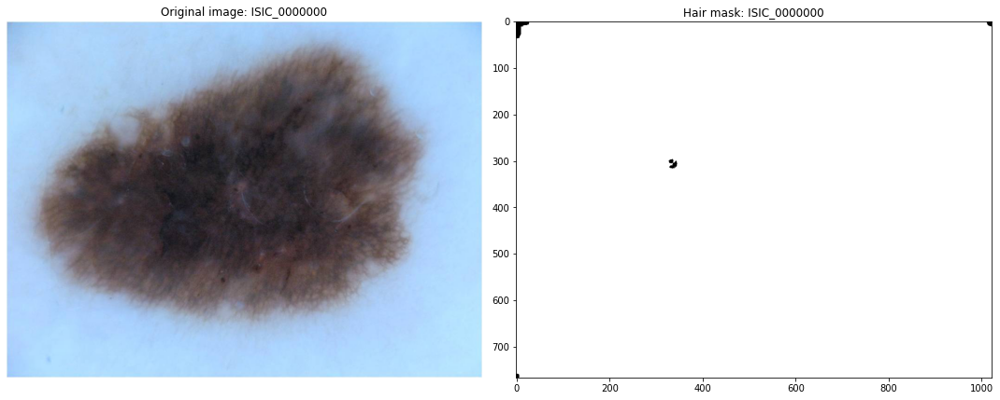

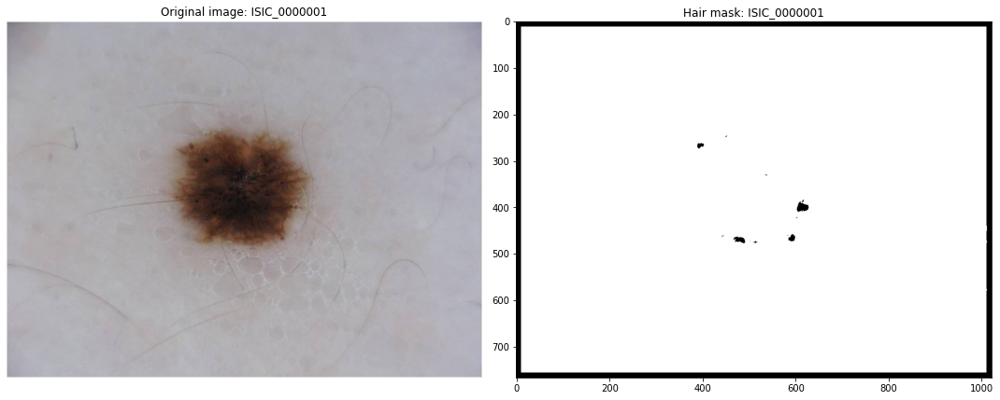

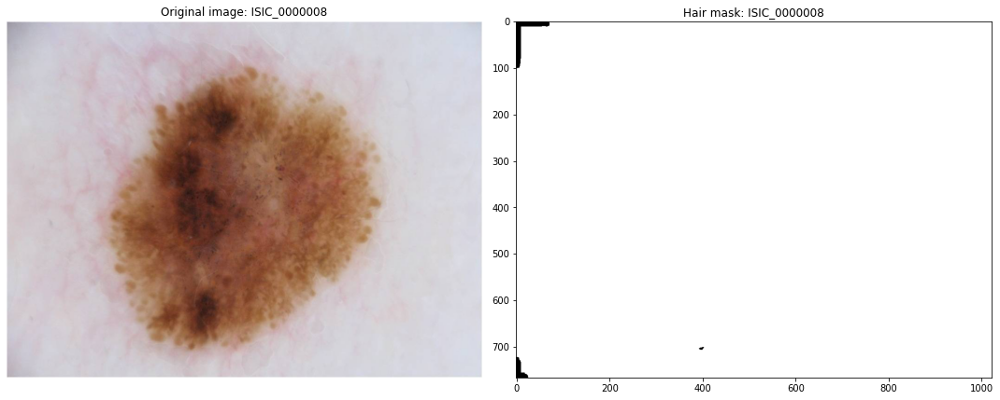

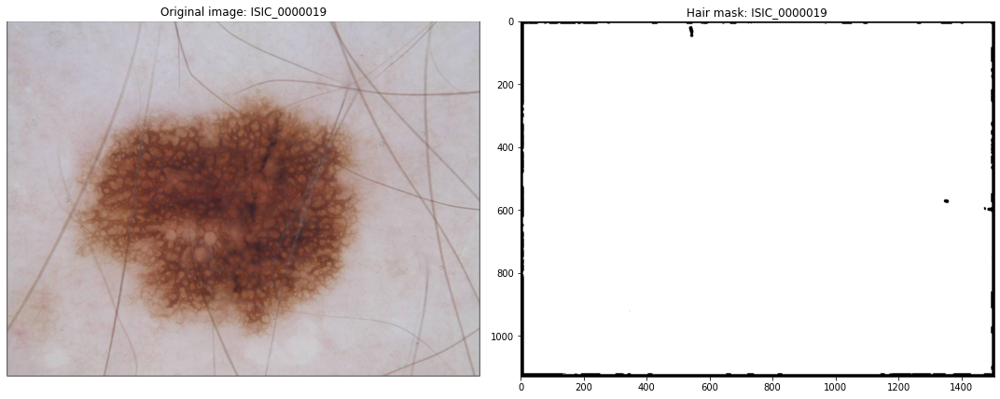

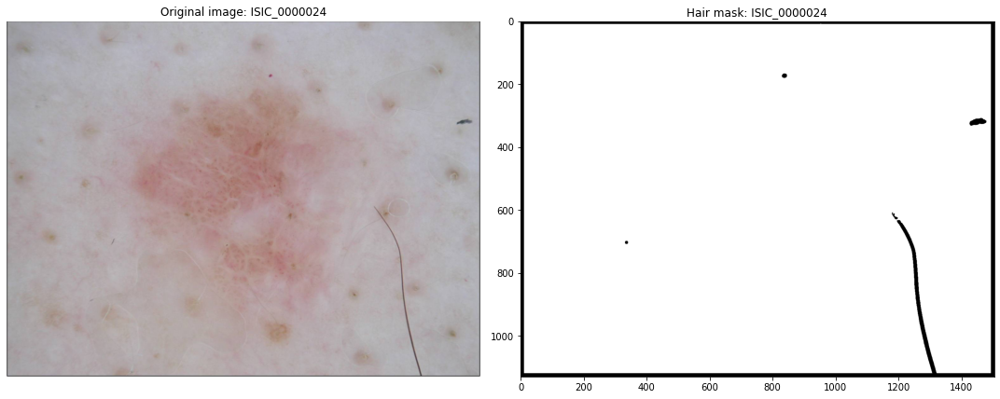

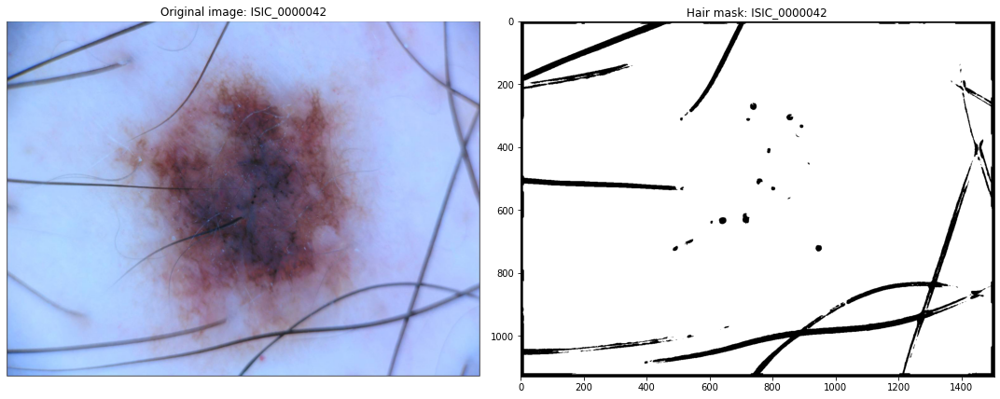

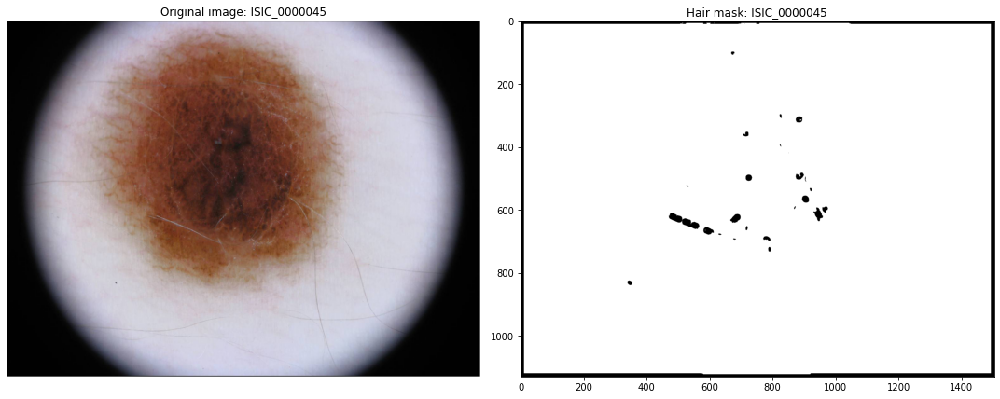

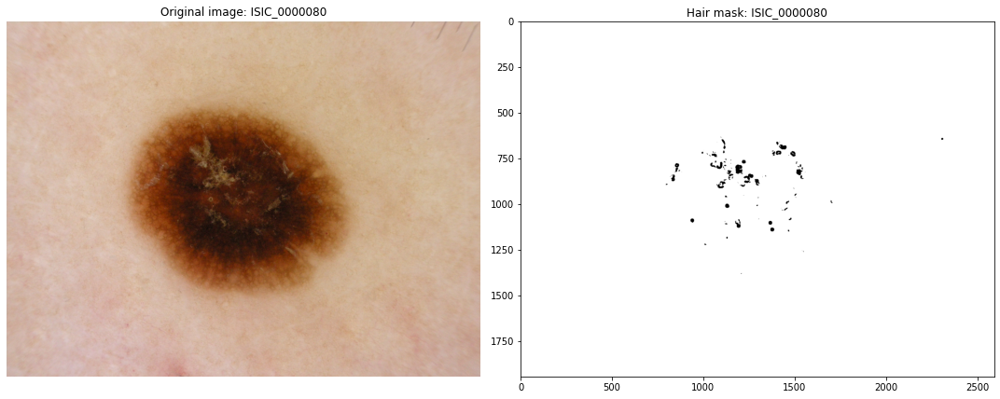

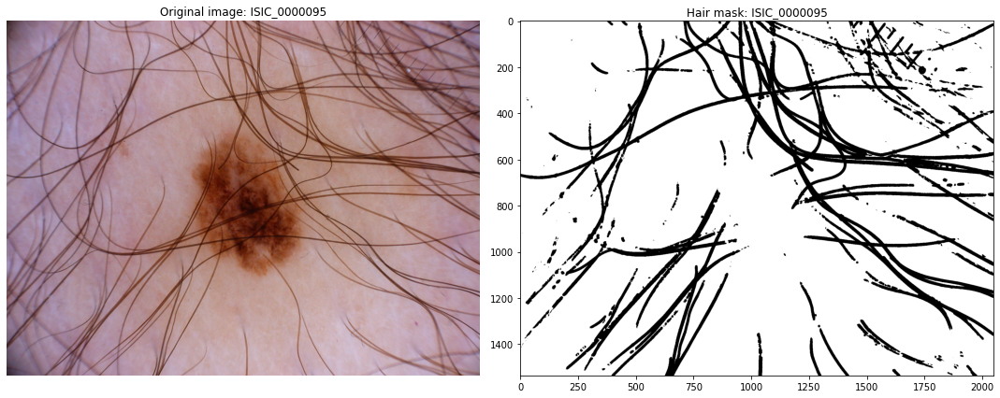

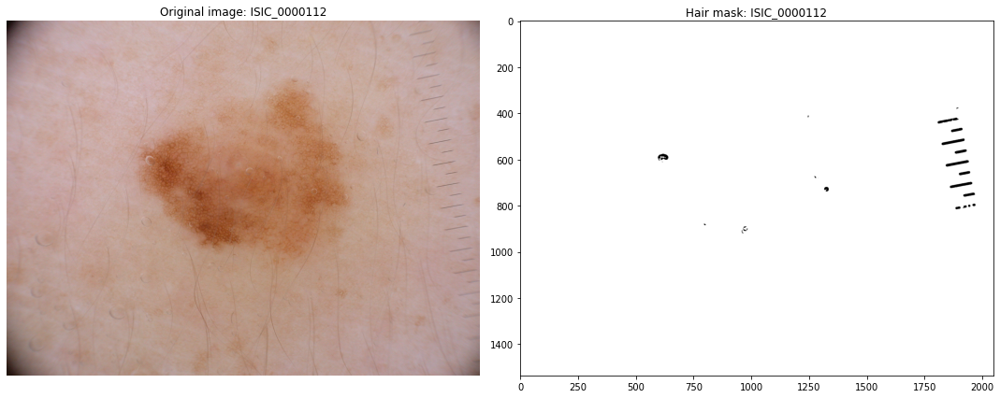

In [ ]:
for i, img in enumerate(imgs):
  hair_mask = hair_removal(img)

  fig, ax = plt.subplots(1,2, figsize = (15,15))
  ax[0].set_title('Original image: ' + str(img_names[i].split("/")[3]))
  ax[0].axis('off')
  ax[0].imshow(img)

  ax[1].set_title('Hair mask: ' + str(img_names[i].split("/")[3]))
  ax[1].imshow(hair_mask, cmap="gray")
  
  plt.tight_layout()
  plt.show()


# Nevus segmentation
This section implements the nevus segmentation functions.

## Approach 1: KMeans with prior dilation
- Firstly, the images are dilated with an disk to make the hair cell shape (line) more blurried. The nevus cells will not be affected by this operation, since they have a disk shape.
- In the kMeans nevus segmentation, a kMeans algorithm with k=2 is applied on dilated images to get two clusters. 
- The cluster with lower intensities represents here the nevus cells. The clustering results are binarized by Otsu thresholding to obtain a binary mask of the nevus cells. However, the mask still contains some of the hair cells.
-  This is where the binary hair mask is applied through multiplication with the kMeans mask, setting the hair cell pixels to 0.
-  Connected components are estimated, and the largest connected component is cut out, which represents the nevus cell.
- A problem here is that the kMeans fails two imgs (24, 45).  The decision  if it fails is based on a precision threshold. That's where the Watershed algorithm based on the S-channel of the img is used. 
- The results are filtered using median filtering and closing to remove some noisy pixels, and the final mask is obtained.

In [ ]:
def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    image = np.zeros((w, h))
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i][j] = codebook[labels[label_idx]]
            label_idx += 1
    image = skimage.util.invert(image)
    return image

In [ ]:
def kmeans_alg(img, k):
   image_array = img.reshape((img.shape[0]*img.shape[1],1))
   #fit the model on a randomly sampled subset of the image_array of 1000 points, using shuffle
   training_set = random.sample(list(image_array),1000)
   training_set = np.array(training_set)
   kmeans =  KMeans(n_clusters=k, random_state=0).fit(training_set)
   #predict the labels for all points
   labels = kmeans.predict(np.array(image_array))
   cluster_centers = kmeans.cluster_centers_
   
   return cluster_centers, labels

In [ ]:
def getLargestCC(segmentation):
    labels = skimage.measure.label(segmentation)
    assert( labels.max() != 0 ) # assume at least 1 CC
    connected_component = labels == np.argmax(np.bincount(labels.flat)[1:])+1
    return connected_component

### Example of kMeans segmentation


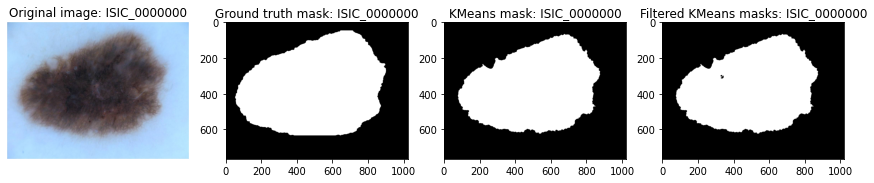

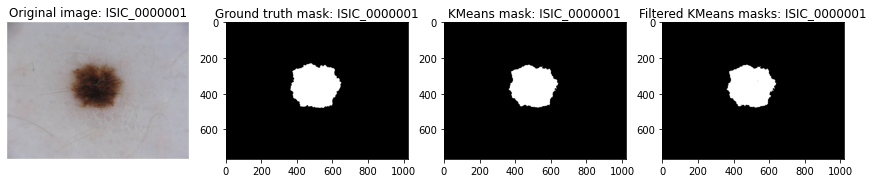

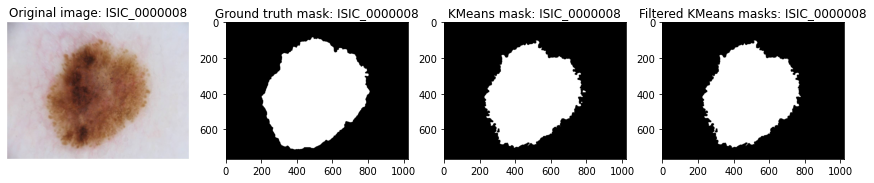

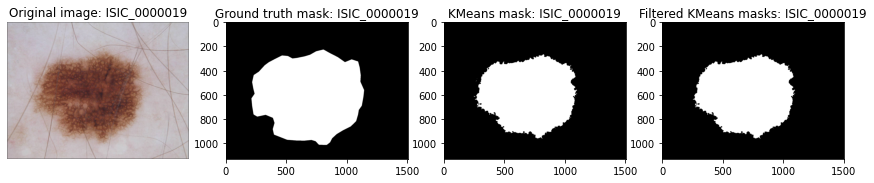

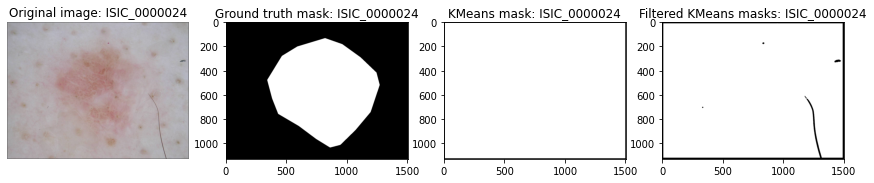

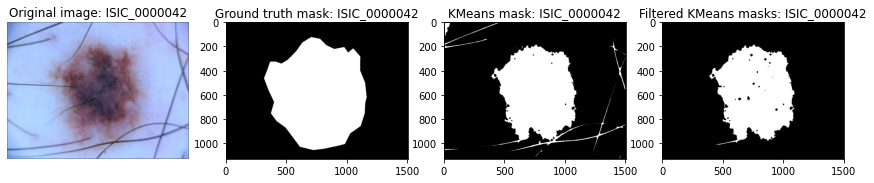

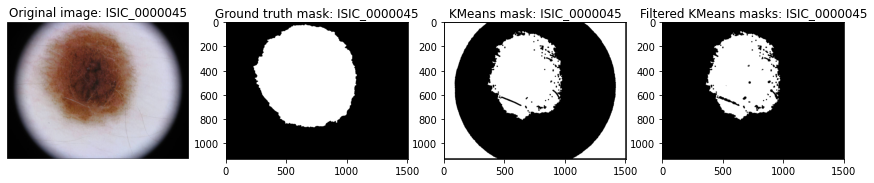

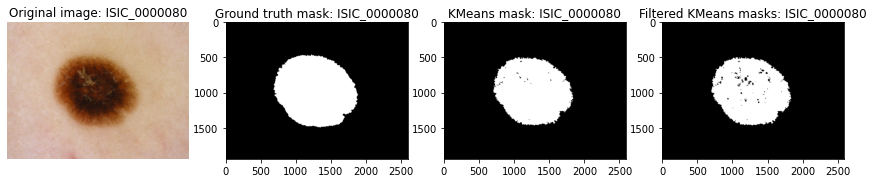

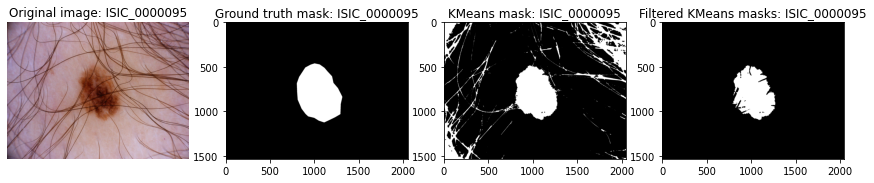

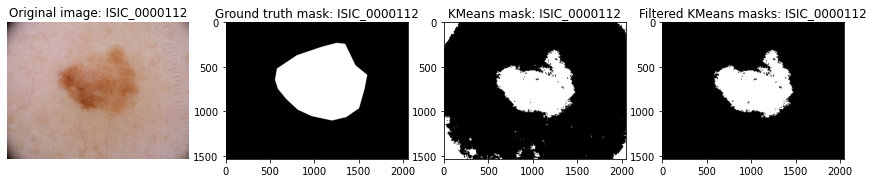

In [ ]:
for i, img in enumerate(imgs):

  grayscale = rgb2gray(img)
  grayscale = morpho.dilation(grayscale, morpho.disk(5))

  cluster_centers, labels = kmeans_alg(grayscale,k=2)
  predicted_mask = recreate_image(cluster_centers, labels, w=grayscale.shape[0], h = grayscale.shape[1])

  thresh = threshold_otsu(predicted_mask)
  predicted_mask = predicted_mask > thresh

  fig, ax = plt.subplots(1,4,figsize = (15,15))
  ax[0].set_title('Original image: ' + str(img_names[i].split("/")[3]))
  ax[0].axis('off')
  ax[0].imshow(img)

  ax[1].set_title('Ground truth mask: ' + str(img_names[i].split("/")[3]))
  ax[1].imshow(masks[i], cmap="gray")
  
  ax[2].set_title('KMeans mask: ' + str(img_names[i].split("/")[3]))
  ax[2].imshow(predicted_mask,cmap='gray')
  
  hair_mask = hair_removal(img)
  hair_masks.append(hair_mask)
  predicted_mask = predicted_mask*hair_mask

  predicted_mask = skimage.measure.label(predicted_mask,connectivity=2)
  predicted_mask = getLargestCC(predicted_mask).astype(int)


  ax[3].set_title('Filtered KMeans masks: ' + str(img_names[i].split("/")[3]))
  ax[3].imshow(predicted_mask,cmap='gray')
  plt.show()

## Approach 2: Color analysis and Watershed algorithm

- Analysed the colors to see in which color space the nevuses was most easily seperated from the rest of the image.  

- Coverted the images (originally in RGB) to HSV and looked at the saturation component.

- Sequential filters were applied on saturation channel to remove artifacts.

- After that, Watershed is applied for the segmentation based on saturation channel.

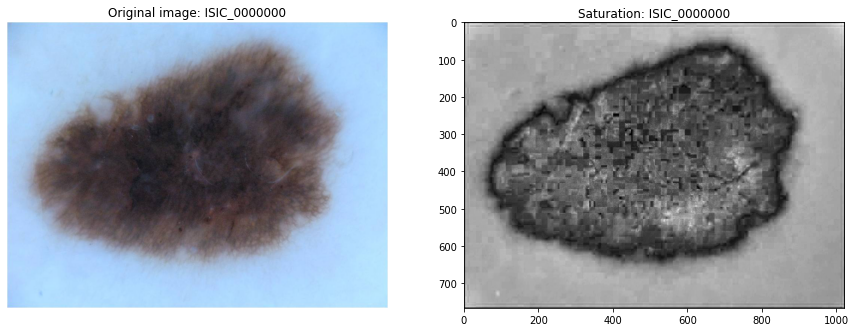

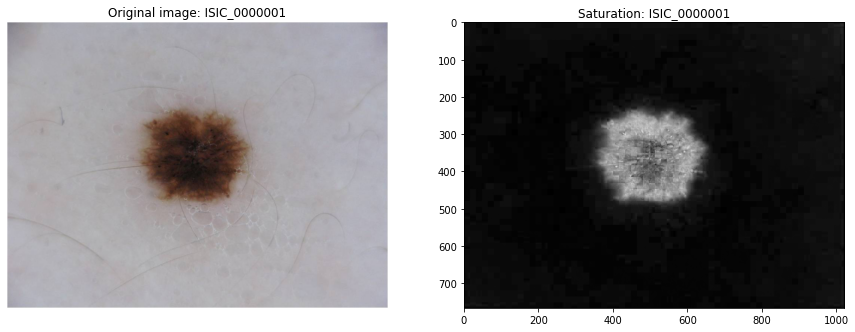

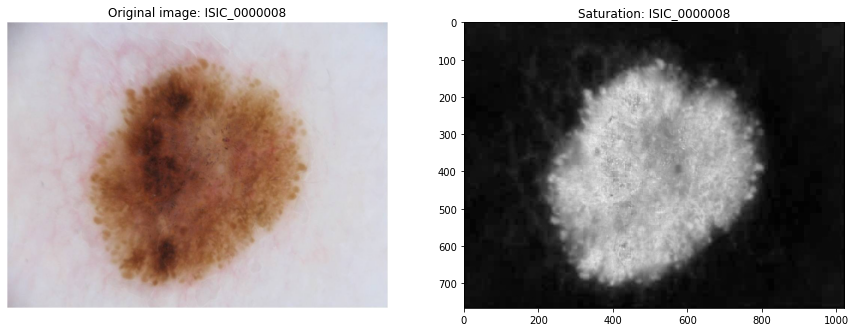

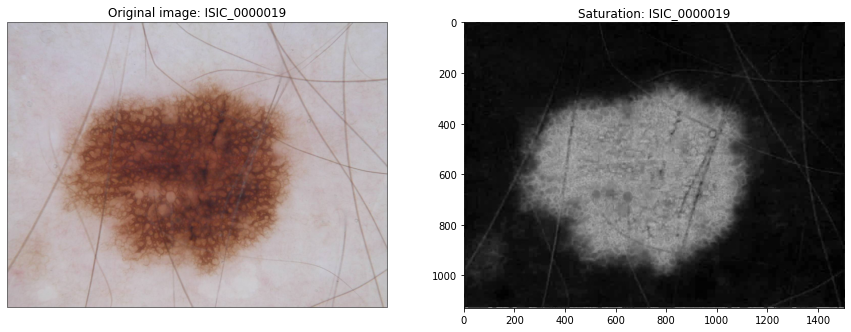

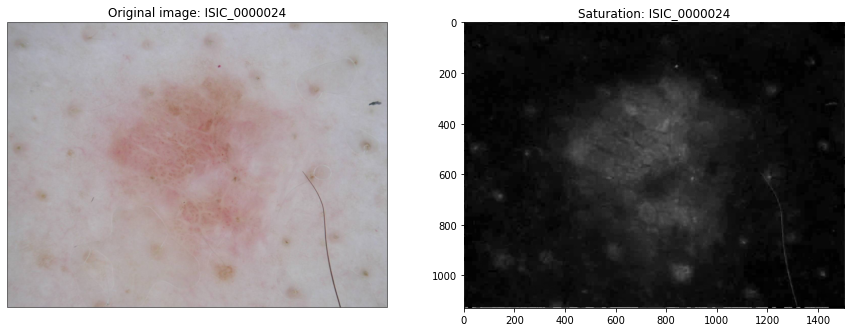

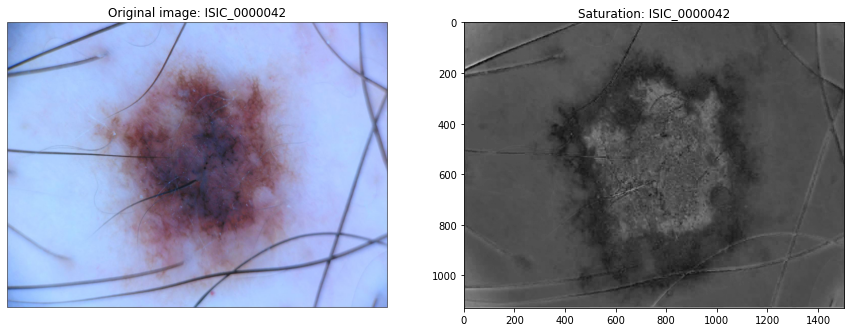

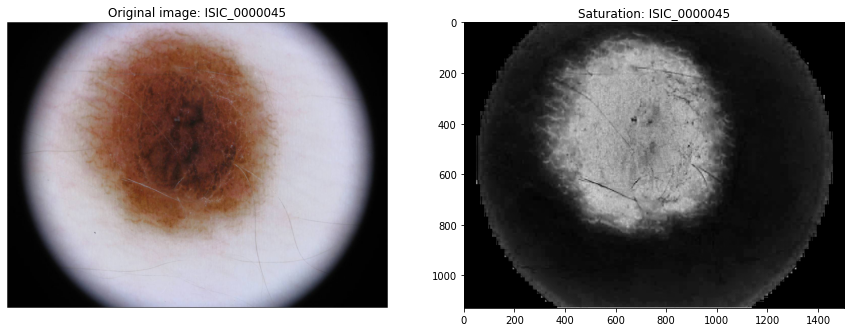

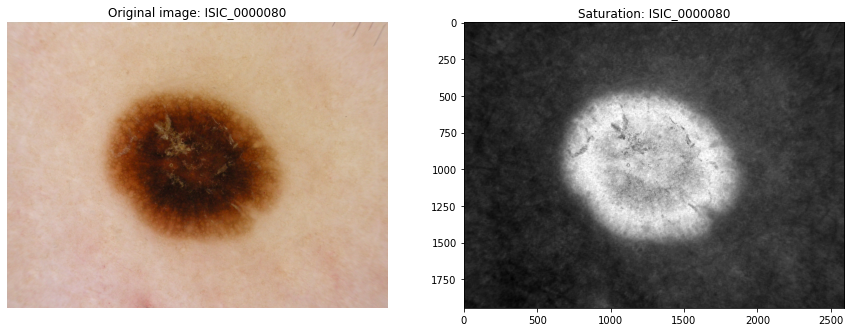

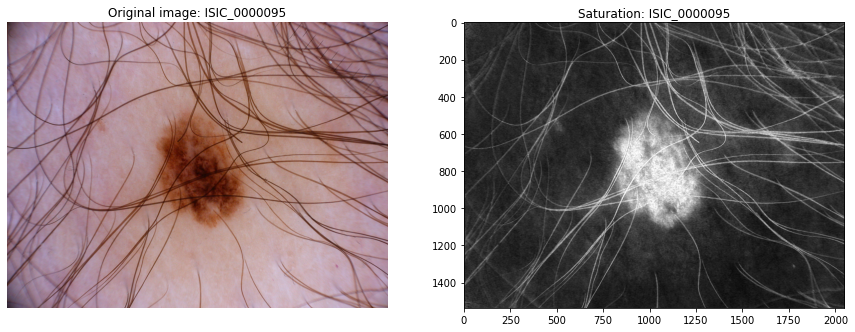

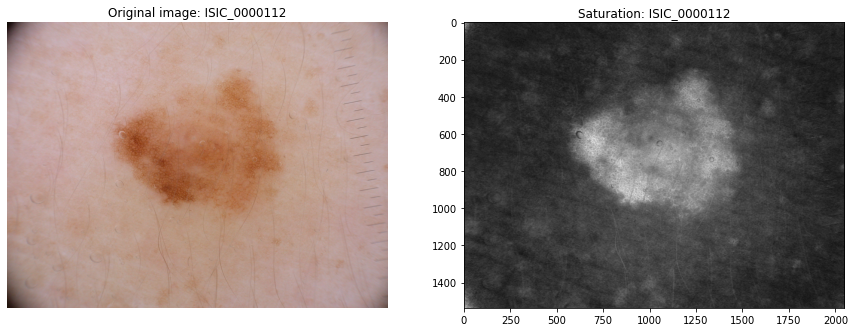

In [ ]:
for i, img in enumerate(imgs):
  fig, ax = plt.subplots(1,2,figsize = (15,15))
  ax[0].set_title('Original image: ' + str(img_names[i].split("/")[3]))
  ax[0].axis('off')
  ax[0].imshow(img)

  imhsv_sat = skimage.color.rgb2hsv(img)[:,:,1]
  ax[1].set_title('Saturation: ' + str(img_names[i].split("/")[3]))
  ax[1].imshow(imhsv_sat, cmap="gray")

In [ ]:
def segmentBySaturation(img):
  imhsv_sat = skimage.color.rgb2hsv(img)[:,:,1]

  strell = morpho.disk(10)
  imhsv_sat_clo = (morpho.closing(imhsv_sat,strell) > imhsv_sat.mean())*1

  se1=morpho.disk(1)
  se2=morpho.disk(2)
  se3=morpho.disk(3)
  se4=morpho.disk(4)
  se5=morpho.disk(5)
  fas1=morpho.closing(morpho.opening(imhsv_sat_clo,se1),se1)
  fas2=morpho.closing(morpho.opening(fas1,se2),se2)
  fas3=morpho.closing(morpho.opening(fas2,se3),se3)
  fas4=morpho.closing(morpho.opening(fas3,se4),se4)
  fas5=morpho.closing(morpho.opening(fas4,se5),se5)

  strell = morpho.disk(10)
  morpho_grad = morpho.dilation(fas5,strell) - morpho.erosion(fas5,strell)

  k = 2
  wat = morpho.watershed(morpho.closing(morpho_grad),k)

  return wat

### Example of Alternating filters 

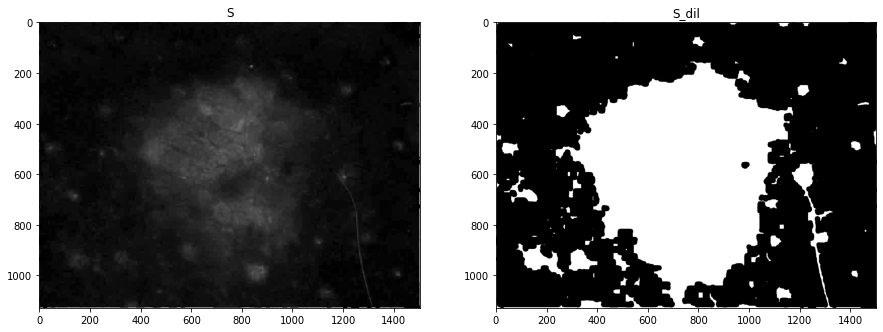

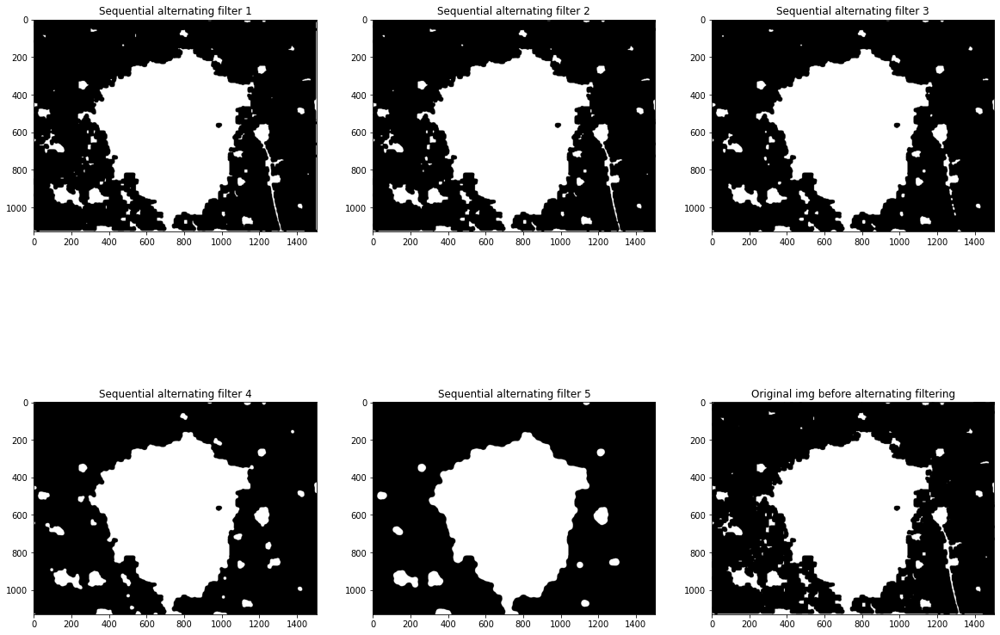

In [ ]:
  imhsv_sat = skimage.color.rgb2hsv(imgs[4])[:,:,1]
  strell = morpho.disk(10)
  imhsv_sat_clo = (morpho.closing(imhsv_sat,strell) > imhsv_sat.mean())*1
  
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 10))
  axes[0].imshow(imhsv_sat, cmap='gray')
  axes[0].set_title('S')
  axes[1].imshow(imhsv_sat_clo, cmap='gray')
  axes[1].set_title('S_dil')

  se1=morpho.disk(1)
  se2=morpho.disk(2)
  se3=morpho.disk(4)
  se4=morpho.disk(8)
  se5=morpho.disk(16)
  fas1=morpho.closing(morpho.opening(imhsv_sat_clo,se1),se1)
  fas2=morpho.closing(morpho.opening(fas1,se2),se2)
  fas3=morpho.closing(morpho.opening(fas2,se3),se3)
  fas4=morpho.closing(morpho.opening(fas3,se4),se4)
  fas5=morpho.closing(morpho.opening(fas4,se5),se5)

  fig,ax = plt.subplots(2,3,figsize = (20,15))
  ax[0,0].imshow(fas1,cmap = "gray")
  ax[0,0].set_title("Sequential alternating filter 1")
  ax[0,1].imshow(fas2,cmap = "gray")
  ax[0,1].set_title("Sequential alternating filter 2")
  ax[0,2].imshow(fas3,cmap = "gray")
  ax[0,2].set_title("Sequential alternating filter 3")

  ax[1,0].imshow(fas4,cmap = "gray")
  ax[1,0].set_title("Sequential alternating filter 4")
  ax[1,1].imshow(fas5,cmap = "gray")
  ax[1,1].set_title("Sequential alternating filter 5")
  ax[1,2].imshow(imhsv_sat_clo,cmap = "gray")
  ax[1,2].set_title("Original img before alternating filtering")

  plt.show()

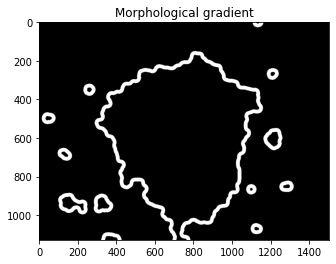

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


Text(0.5, 1.0, 'Results of Watershed segmentation')

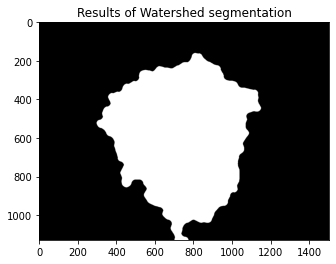

In [ ]:
 strell = morpho.disk(10)
morpho_grad = morpho.dilation(fas5,strell) - morpho.erosion(fas5,strell)
plt.figure()
plt.imshow(morpho_grad,cmap = "gray")
plt.title("Morphological gradient")
plt.show()

k = 2
wat = morpho.watershed(morpho.closing(morpho_grad),k)
plt.imshow(1-wat,cmap='gray')
plt.title("Results of Watershed segmentation")

### Results of Watershed segmentation


/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


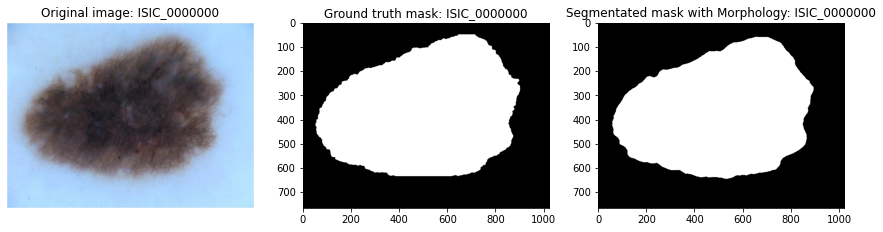

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


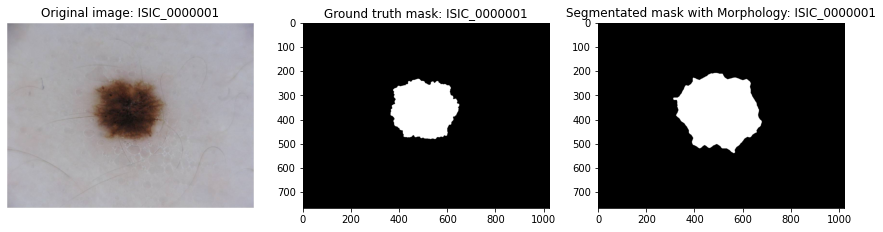

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


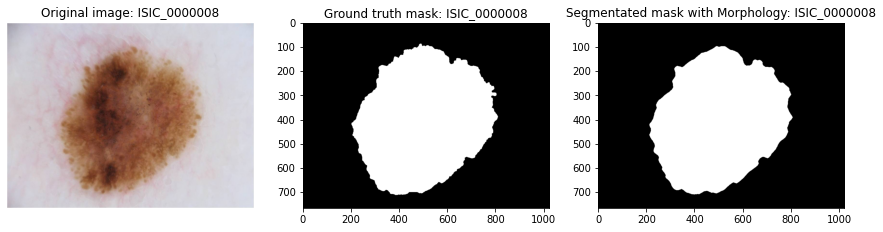

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


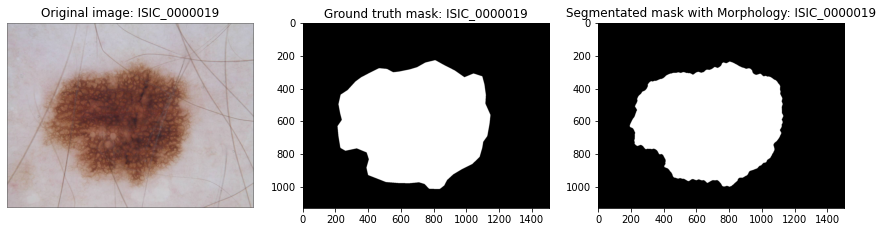

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


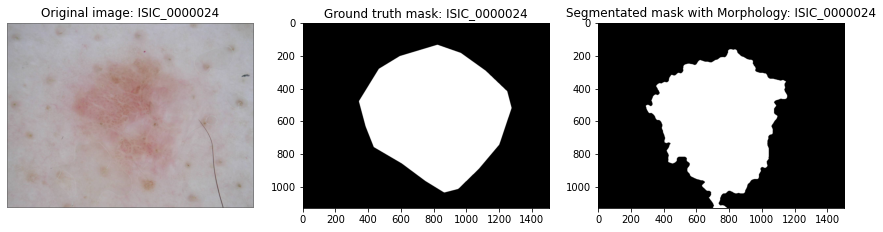

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


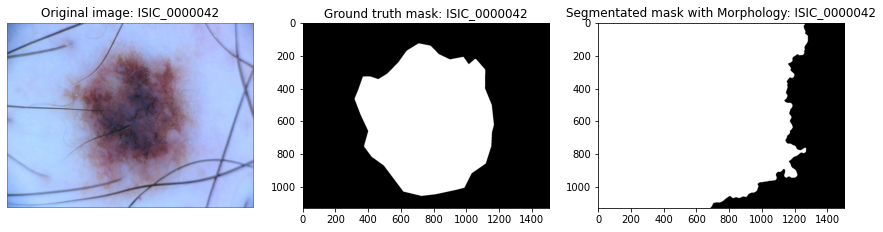

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


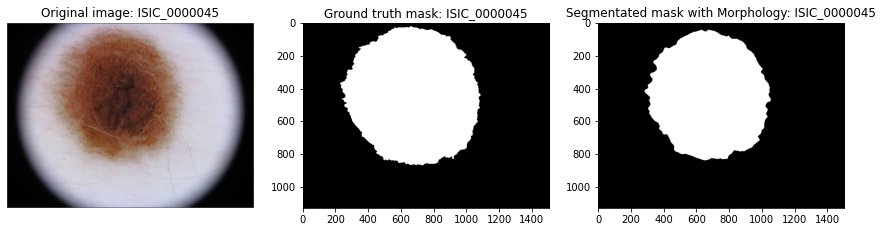

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


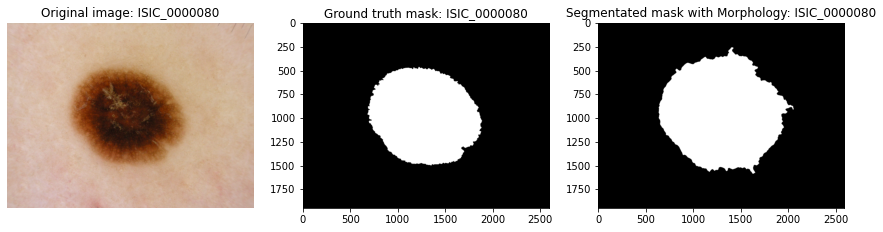

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


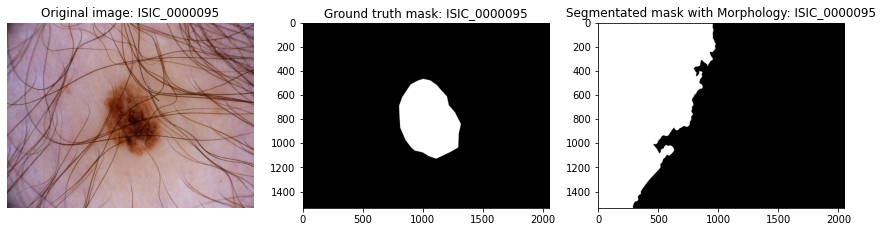

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


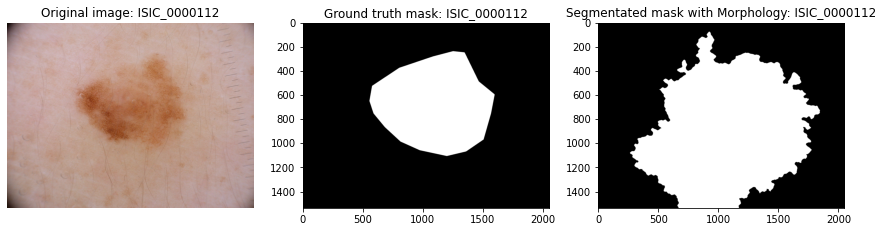

In [ ]:
segmented = []

for i,img in enumerate(imgs):
  s = segmentBySaturation(img)
  segmented.append(s)
  
  # Display all results, alongside original image
  fig, ax = plt.subplots(1,3,figsize = (15,15))
  ax[0].set_title('Original image: ' + str(img_names[i].split("/")[3]))
  ax[0].axis('off')
  ax[0].imshow(img)

  ax[1].set_title('Ground truth mask: ' + str(img_names[i].split("/")[3]))
  ax[1].imshow(masks[i], cmap="gray")
  
  ax[2].set_title('Segmentated mask with Morphology: ' + str(img_names[i].split("/")[3]))
  ax[2].imshow(1-segmented[i],cmap='gray')
  plt.show()

# Final results
This section shows the final results where both, kMeans and the Watershed algorithm were combined to obtain the final segmentation results. 

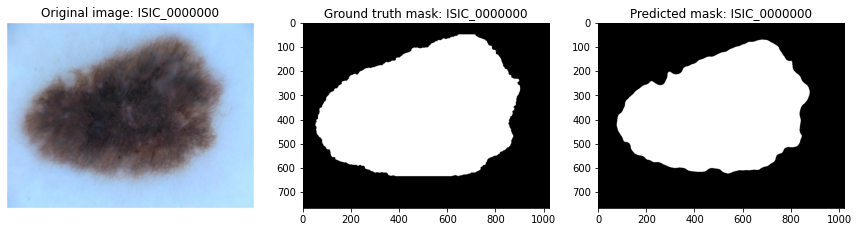

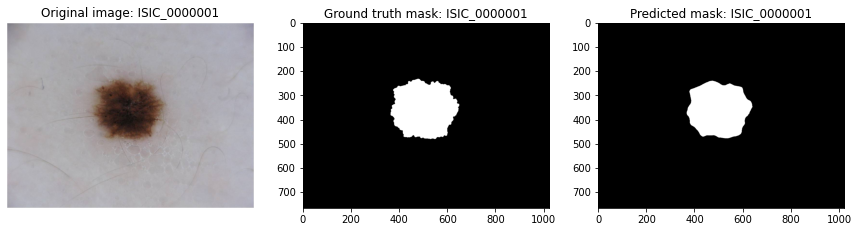

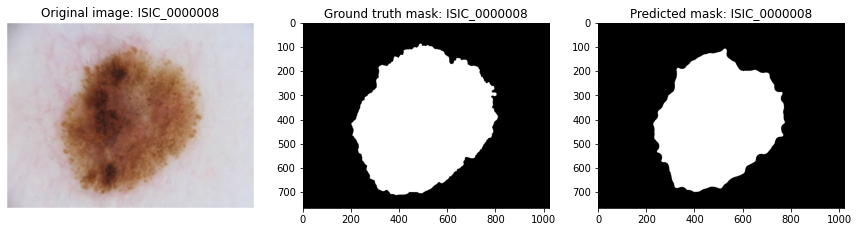

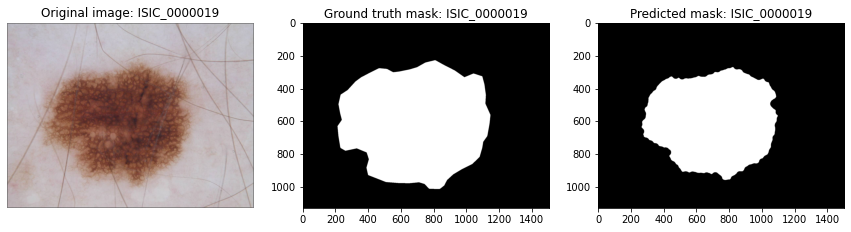

Implementing Watershed ...


/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


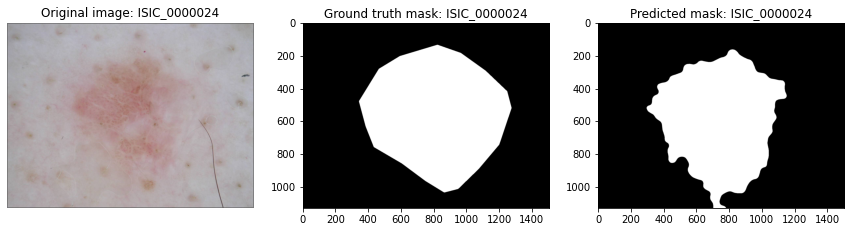

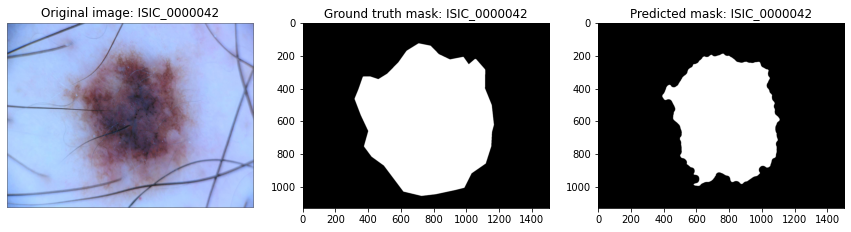

Implementing Watershed ...


/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


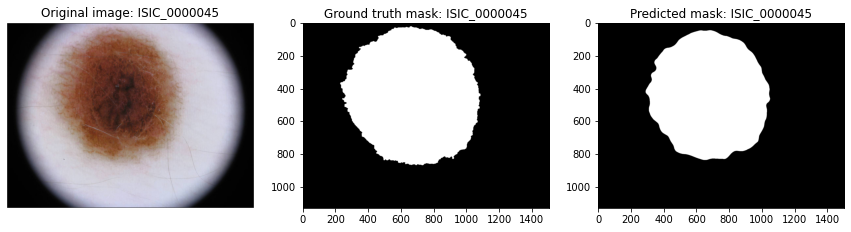

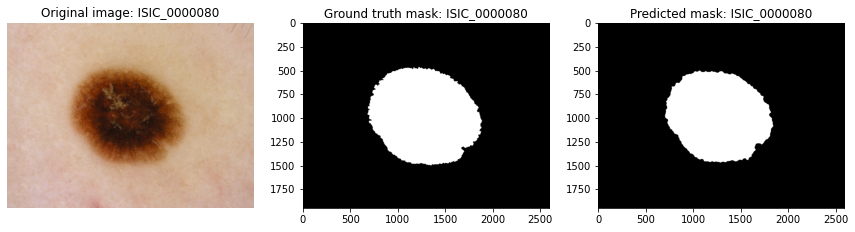

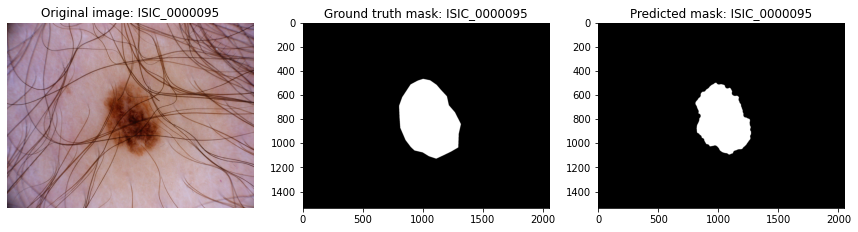

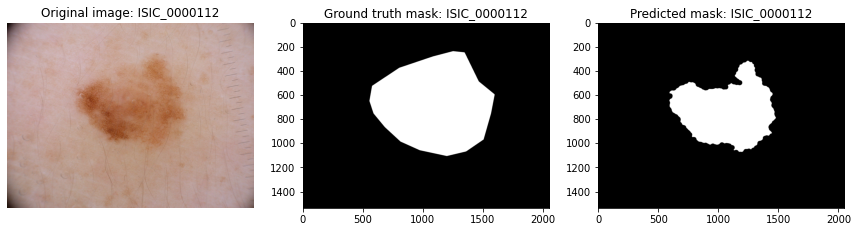

In [ ]:
cluster_centers = []
labels = []
hair_masks = []
predicted_masks = []

for i, img in enumerate(imgs):

  grayscale = rgb2gray(img)
  grayscale = morpho.dilation(grayscale, morpho.disk(5))

  cluster_centers, labels = kmeans_alg(grayscale,k=2)
  predicted_mask = recreate_image(cluster_centers, labels, w=grayscale.shape[0], h = grayscale.shape[1])

  thresh = threshold_otsu(predicted_mask)
  predicted_mask = predicted_mask > thresh

  hair_mask = hair_removal(img)
  hair_masks.append(hair_mask)
  predicted_mask = predicted_mask*hair_mask

  predicted_mask = skimage.measure.label(predicted_mask,connectivity=2)

  if precision(predicted_mask, masks[i]) > 0.5:
    predicted_mask = getLargestCC(predicted_mask).astype(int)
    predicted_mask = skimage.filters.median(predicted_mask, morpho.disk(10))
  else:
    print("Implementing Watershed ...")
    predicted_mask = segmentBySaturation(img)
    predicted_mask = np.invert(predicted_mask)
    predicted_mask = skimage.filters.median(predicted_mask, morpho.disk(20))
  
  predicted_mask = morpho.closing(predicted_mask, morpho.disk(20))

  predicted_masks.append(predicted_mask)
  
  fig, ax = plt.subplots(1,3,figsize = (15,15))
  ax[0].set_title('Original image: ' + str(img_names[i].split("/")[3]))
  ax[0].axis('off')
  ax[0].imshow(img)

  ax[1].set_title('Ground truth mask: ' + str(img_names[i].split("/")[3]))
  ax[1].imshow(masks[i], cmap="gray")
  
  ax[2].set_title('Predicted mask: ' + str(img_names[i].split("/")[3]))
  ax[2].imshow(predicted_mask,cmap='gray')
  plt.show()

# Qualitative Evaluation
In this part, a qualitative analysis is performed to compare the ground truth to the predictions. This implemented by mappind the contours of the ground truth mask and the predicted mask onto the original images. 

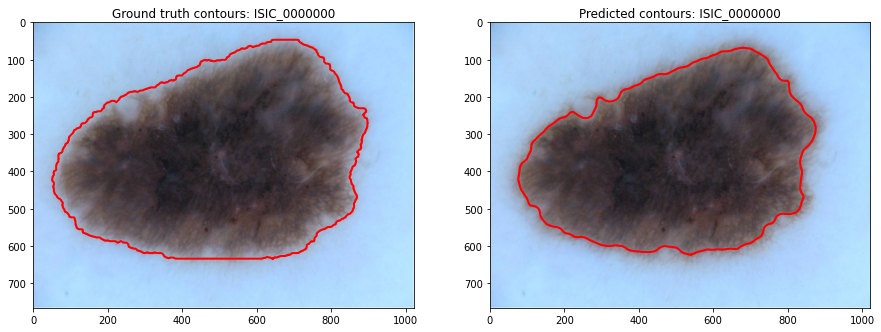

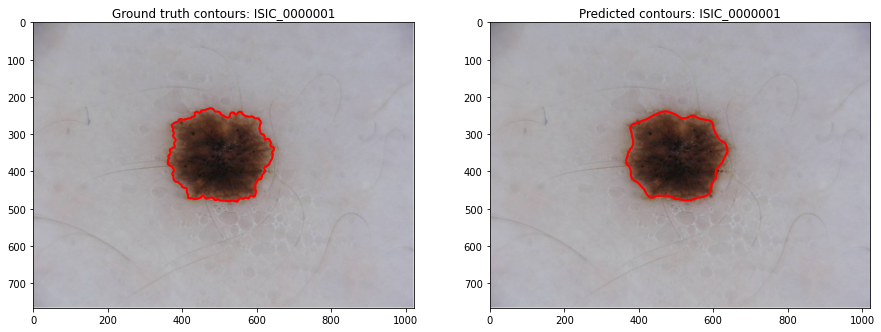

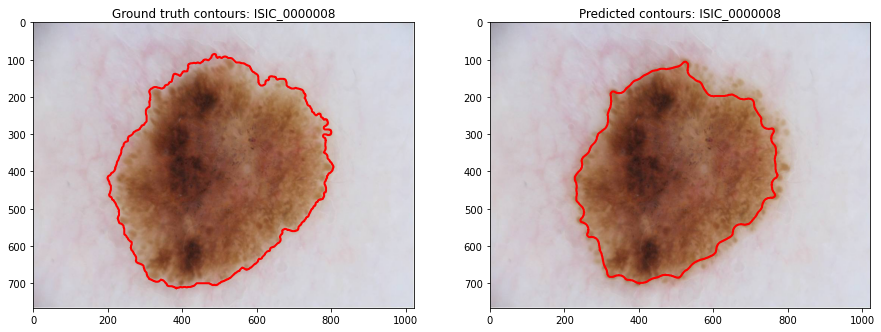

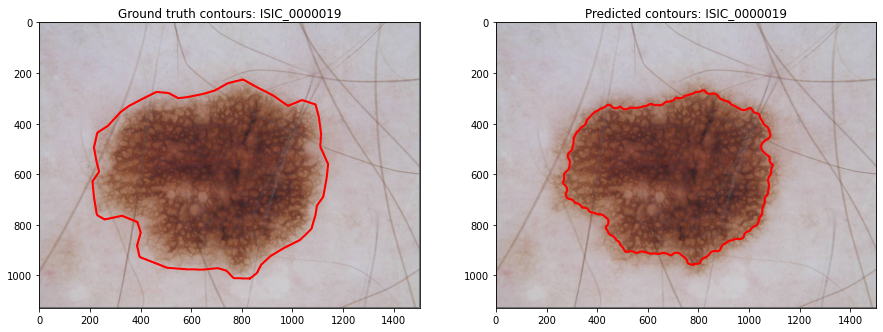

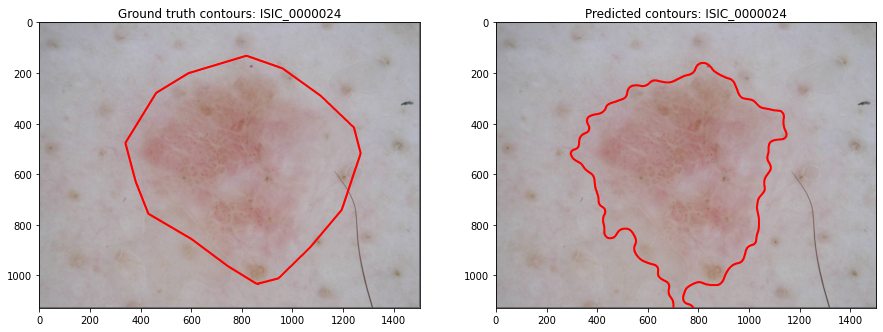

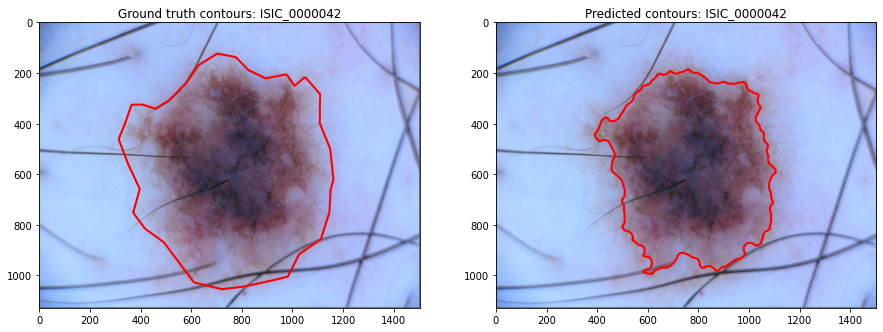

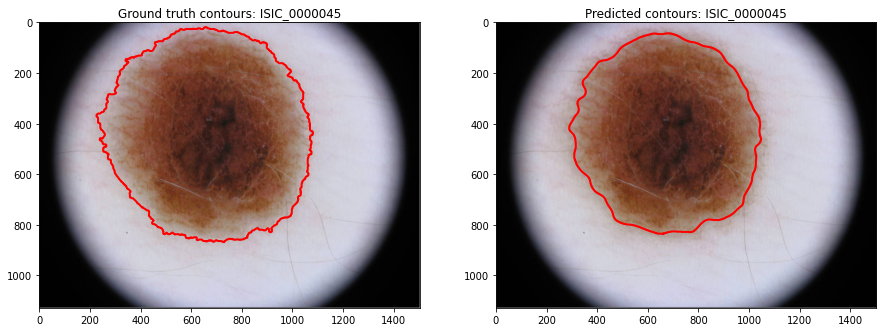

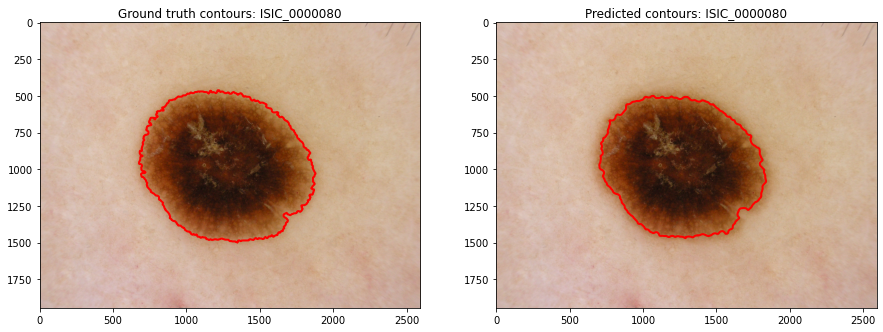

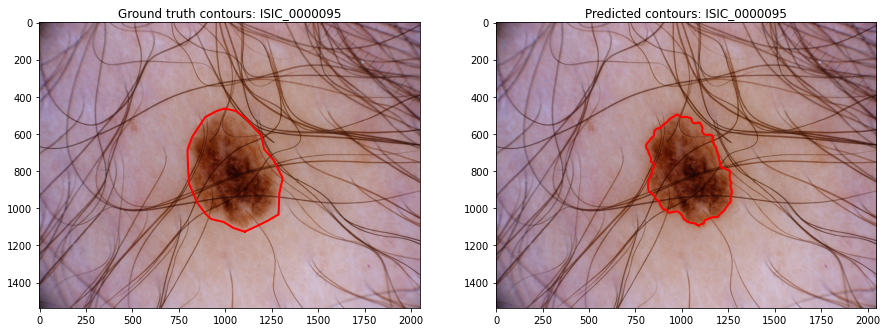

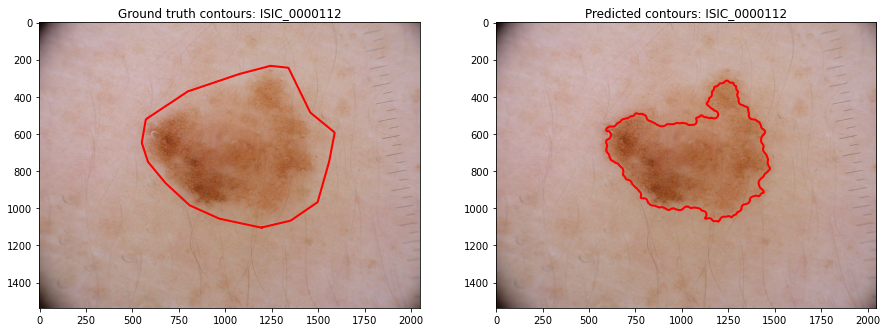

In [ ]:
for i,img in enumerate(imgs):
  contours = []
  pred_contours = skimage.measure.find_contours(predicted_masks[i])
  gt_contours = skimage.measure.find_contours(masks[i])
  fig, ax = plt.subplots(1,2, figsize=(15,15))
  ax[0].imshow(img, cmap=plt.cm.gray)
  for contour in gt_contours:
      ax[0].plot(contour[:, 1], contour[:, 0], linewidth=2,color="r")
      ax[0].axis('image')
      ax[0].set_title("Ground truth contours: " + str(img_names[i].split("/")[3]))
  ax[1].imshow(img, cmap=plt.cm.gray)
  for contour in pred_contours:
      ax[1].plot(contour[:, 1], contour[:, 0], linewidth=2,color="r")
      ax[1].axis('image')
      ax[1].set_title("Predicted contours: " + str(img_names[i].split("/")[3]))

# Quantitative Evaluation
In this section, the similarity between ground truth and predictions is evaluated based on similarity metrics for binary arrays, which are: jaccard index, dice coefficients, precision and recall. 

In [ ]:
def precision(result, reference):    
    result = np.atleast_1d(result.astype(np.bool))
    reference = np.atleast_1d(reference.astype(np.bool))
        
    tp = np.count_nonzero(result & reference)
    fp = np.count_nonzero(result & ~reference)
    
    try:
        precision = tp / float(tp + fp)
    except ZeroDivisionError:
        precision = 0.0
    
    return precision


In [ ]:
def jc(result, reference):
    result = np.atleast_1d(result.astype(np.bool))
    reference = np.atleast_1d(reference.astype(np.bool))
    
    intersection = np.count_nonzero(result & reference)
    union = np.count_nonzero(result | reference)
    
    jc = float(intersection) / float(union)
    
    return jc

In [ ]:
def dc(result, reference):
    result = np.atleast_1d(result.astype(np.bool))
    reference = np.atleast_1d(reference.astype(np.bool))
    
    intersection = np.count_nonzero(result & reference)
    
    size_i1 = np.count_nonzero(result)
    size_i2 = np.count_nonzero(reference)
    
    try:
        dc = 2. * intersection / float(size_i1 + size_i2)
    except ZeroDivisionError:
        dc = 0.0
    
    return dc

In [ ]:
def recall(result, reference):
    result = np.atleast_1d(result.astype(np.bool))
    reference = np.atleast_1d(reference.astype(np.bool))
        
    tp = np.count_nonzero(result & reference)
    fn = np.count_nonzero(~result & reference)

    try:
        recall = tp / float(tp + fn)
    except ZeroDivisionError:
        recall = 0.0
    
    return recall

In [ ]:
def get_metric(gt,pred,type):
  if type=="dc":
    return dc(pred,gt)
  elif type=="jc":
    return jc(pred,gt)
  elif type=="hf":
    return hd(pred,gt)
  elif type=="precision":
    return precision(pred,gt)
  else:
    return recall(pred,gt)

In [ ]:
metrics = ["jc","dc","precision",recall]

jcs = []
dcs = []
precisions= []
recalls = []

for metric in metrics:
  for i, img in enumerate(predicted_masks):
    score = get_metric(predicted_masks[i], masks[i], type=metric)
    if metric == "jc":
      jcs.append(score)
    elif metric == "dc":
      dcs.append(score)
    elif metric == "precision":
      precisions.append(score)
    else:
      recalls.append(score)

In [ ]:
data = {'Img': [i.split("/")[-1] for i in img_names], 'Jaccard Score': jcs, 'Dice Score': dcs,'Precision': precisions, 'Recall':recalls}
results_df = pd.DataFrame(data=data)
results_df

,Img,Jaccard Score,Dice Score,Precision,Recall
0,ISIC_0000000,0.844305,0.915580,0.844305,1.000000
1,ISIC_0000001,0.911617,0.953765,0.911720,0.999877
2,ISIC_0000008,0.840205,0.913165,0.840205,1.000000
3,ISIC_0000019,0.754766,0.860247,0.754766,1.000000
4,ISIC_0000024,0.332127,0.498642,1.000000,0.332127
5,ISIC_0000042,0.708702,0.829521,0.708702,1.000000
6,ISIC_0000045,0.319011,0.483712,1.000000,0.319011
7,ISIC_0000080,0.886810,0.940010,0.886810,1.000000
8,ISIC_0000095,0.775041,0.873266,0.775060,0.999968
9,ISIC_0000112,0.619290,0.764891,0.619290,1.000000


In [ ]:
results_df.describe()

,Jaccard Score,Dice Score,Precision,Recall
count,10.000000,10.000000,10.000000,10.000000
mean,0.699187,0.803280,0.834086,0.865098
std,0.214957,0.173609,0.122763,0.284374
min,0.319011,0.483712,0.619290,0.319011
25%,0.641643,0.781048,0.759840,0.999900
50%,0.764904,0.866756,0.842255,1.000000
75%,0.843280,0.914976,0.905492,1.000000
max,0.911617,0.953765,1.000000,1.000000


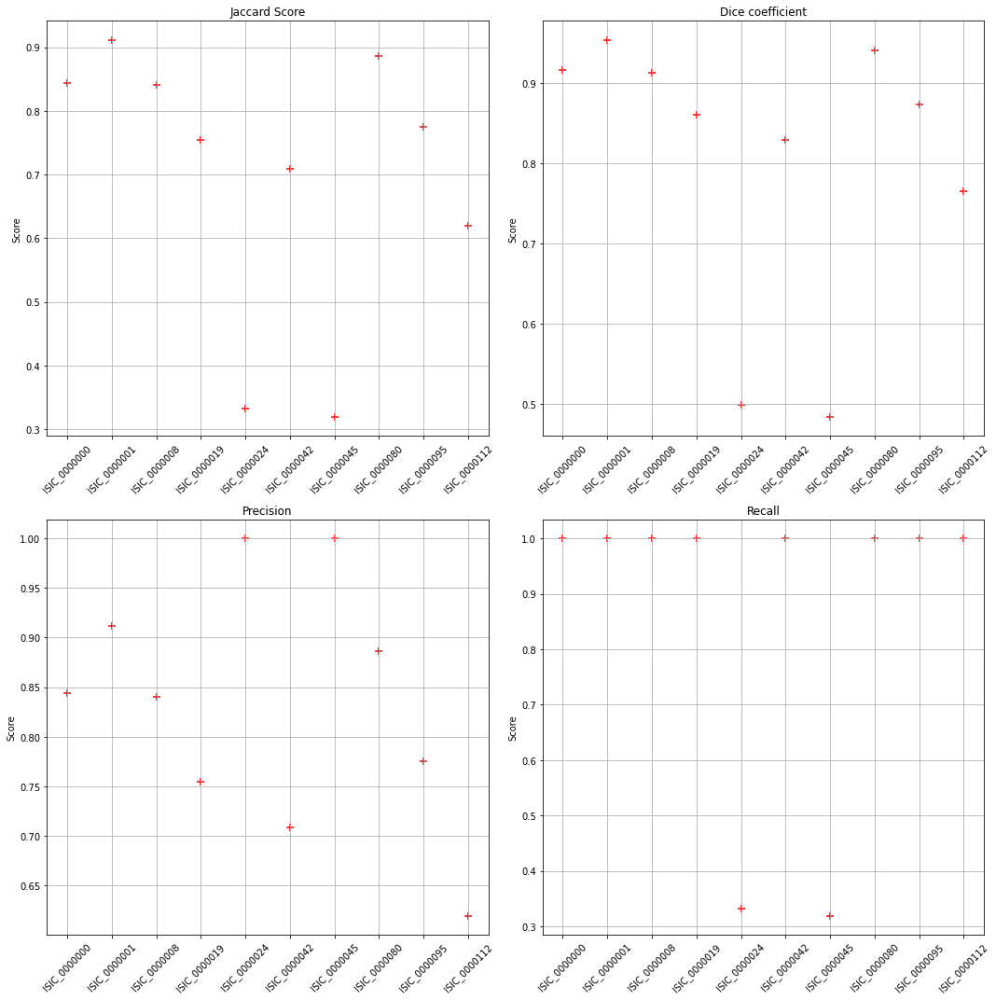

In [ ]:
fig, ax = plt.subplots(2,2, figsize=(15,15))
x = [0,1,2,3,4,5,6,7,8,9]
img_names = [i.split("/")[-1] for i in img_names]

ax[0,0].scatter(x,jcs,marker="+", s=50, color="r")
ax[0,0].set_title("Jaccard Score")
ax[0,0].set_xticks(range(0,10))
ax[0,0].set_xticklabels(img_names,rotation=45)
ax[0,0].grid(True)
ax[0,0].set_ylabel("Score")

ax[0,1].scatter(x,dcs,marker="+", s=50,color="r")
ax[0,1].set_title("Dice coefficient")
ax[0,1].set_xticks(range(0,10))
ax[0,1].set_xticklabels(img_names,rotation=45)
ax[0,1].grid(True)
ax[0,1].set_ylabel("Score")


ax[1,0].scatter(x,precisions,marker="+", s=50,color="r")
ax[1,0].set_title("Precision")
ax[1,0].set_xticks(range(0,10))
ax[1,0].set_xticklabels(img_names,rotation=45)
ax[1,0].grid(True)
ax[1,0].set_ylabel("Score")

ax[1,1].scatter(x,recalls,marker="+", s=50,color="r")
ax[1,1].set_title("Recall")
ax[1,1].set_xticks(range(0,10))
ax[1,1].set_xticklabels(img_names,rotation=45)
ax[1,1].grid(True)
ax[1,1].set_ylabel("Score")

fig.tight_layout()

# Discussion
Advantages: 
+ Very good segmentation results on the images.
+ Segmentation is in some cases more accurate  than ground truth (see qualitative evaluation on Img 24). 
+ Works also on noisy images.
+ Considerably low computational complexity.

Disadvantages: 
- Thresholds need to be set prior to the evaluation (thus expert knowledge needed). Thresholds are on the segmentation decision (kMeans vs Watershed) and hair cell removal. 
- In Image 00, important blob features were not detected. These are needed for nevus classification.
- No global solution presented.
- Problem for low contrast images (like Img 24). Problem could not be solved histogram equalization.


# Conclusion
The presented approach represents an valid and accurate processing pipeline for the segementation of nevus cells from RGB images. 

Positive experiences
- Task could be easily sub-divided.
- KMeans worked really well on most of the images, without much pre-processing.
- Only methods presented in course were used.


Challenges
- Find a global solution for the dataset. 
- Fine tuning the watershed segmentation.
- Finding sizes for morphological operations.
- Lower contrast in imgs biggest challenge, more than hair removal.

Further work:
- Check for characteristics of imgs and decide upon segmentation algorithm (look ahead solution).
- Inspect further preprocessing  methods for raw imgs.


# Work distribution
- Adam: implemented the data loading, kMeans segmentation and qualitative evaluations.
- Martin: implemented the color filtering and the watershed algorithm.
- Ondrej: fine-tuning the hair removal functions and post-processing of the final masks. Also worked on the quantitative evaluations.
- Fatimah: implemented the main functions for hair removal and fine-tuned the morphological operations done there.